<div style="text-align: center; background: linear-gradient(to right, #3b82f6, #60a5fa); padding: 30px; border-radius: 15px; box-shadow: 0 4px 12px rgba(0,0,0,0.2);">
  <h1 style="color: white; font-weight: 800; font-size: 32px; margin-bottom: 10px;">
    Evaluating <a href="https://huggingface.co/ibm-granite/granite-docling-258M" target="_blank" rel="noopener noreferrer" style="color:#d1d5db; text-decoration: underline;">IBM Granite DocLing 258M</a> for Document Parsing & Layout Understanding
  </h1>
  <p style="color: #f1f5f9; font-size: 18px; margin: 0;">
    A practical exploration across diverse PDF page structures (multi-column text, tables, charts, and forms)
  </p>
</div>

# Introduction

This notebook reviews the [**IBM Granite DocLing 258M**](https://huggingface.co/ibm-granite/granite-docling-258M) model, designed for **document understanding and layout-aware text extraction**.

We explore its performance across:

* 📄 Academic papers (multi-column layouts)
* 📊 Business reports with tables & charts
* 🧾 Invoices and structured forms
* 📚 Complex layouts combining text, images, and headings

Our objectives are to:

* Assess how the model handles diverse document structures
* Identify strengths and limitations in parsing
* Highlight potential use cases for real-world workflows

# **1. Install Libraries**

In [1]:
%%capture
! pip install -U docling
! apt-get update && apt-get install -y poppler-utils
! pip install -q pdf2image

# **2. Import Libraries**

In [30]:
from pathlib import Path
from IPython.display import HTML, display
import html, base64, mimetypes

# **3. Inference**

In [37]:
def human_size(n):
    for u in ["B","KB","MB","GB","TB"]:
        if n < 1024: return f"{n:.1f} {u}"
        n /= 1024
    return f"{n:.1f} PB"

def _img_data_uri(img_path: Path):
    """Return data URI for an image; falls back to file URL if Pillow isn't available."""
    try:
        from PIL import Image
        mime, _ = mimetypes.guess_type(str(img_path))
        if not mime: mime = "image/png"
        with open(img_path, "rb") as f:
            b = f.read()
        return f"data:{mime};base64," + base64.b64encode(b).decode("ascii")
    except Exception:
        return str(img_path)

def show_doc_and_md(media_path, md_path, title="Document Viewer",
                      max_width="1300px", prefer_image=True,
                      pdf_dpi=200, pdf_height_vh=96, image_max_vh=96):
    """
    Display a PDF (first page) or an image on the left, and markdown content on the right.

    media_path: path to a .pdf or an image (.png/.jpg/.jpeg/.webp/.tif/.tiff/.bmp/.gif)
    md_path:    path to a markdown file rendered on the right
    """
    from pathlib import Path
    media_file = Path(media_path)
    md_file = Path(md_path)

    try:
        import markdown as mdlib
        from markdown.extensions.codehilite import CodeHiliteExtension
        md_html = mdlib.markdown(
            md_file.read_text(encoding="utf-8"),
            extensions=["extra", "fenced_code", CodeHiliteExtension(noclasses=False, linenums=False, guess_lang=True)],
        )
    except ImportError as e:
        raise ImportError("Please install: !pip install markdown pygments") from e

    ext = media_file.suffix.lower()
    is_pdf = ext == ".pdf"
    is_img = ext in {".png", ".jpg", ".jpeg", ".webp", ".tif", ".tiff", ".bmp", ".gif"}

    media_size = human_size(media_file.stat().st_size) if media_file.exists() else "?"
    md_size    = human_size(md_file.stat().st_size) if md_file.exists() else "?"
    img_dims = None
    if is_img:
        try:
            from PIL import Image
            with Image.open(media_file) as im:
                img_dims = f"{im.width}×{im.height}px"
        except Exception:
            img_dims = None

    pdf_img_data_uri = None
    if is_pdf and prefer_image:
        try:
            from pdf2image import convert_from_path
            pages = convert_from_path(media_file, dpi=pdf_dpi, first_page=1, last_page=1)
            if pages:
                from io import BytesIO
                buf = BytesIO()
                pages[0].save(buf, format="PNG")
                pdf_img_data_uri = "data:image/png;base64," + base64.b64encode(buf.getvalue()).decode("ascii")
        except Exception:
            pdf_img_data_uri = None

    css = f"""
    :root {{
      --bg: #ffffff; --fg: #111827; --muted: #6b7280; --border: #e5e7eb;
      --accent: #2563eb; --code-bg: #f8fafc; --card-bg: #ffffff; --soft: 0 1px 0 rgba(0,0,0,.03);
    }}
    html, body {{ background: var(--bg); }}
    body {{
      color: var(--fg); font-family: ui-sans-serif, system-ui, -apple-system, Segoe UI, Roboto, Helvetica, Arial;
      line-height: 1.6; margin: 0; padding: 24px;
    }}

    .wrap {{
      max-width: {max_width};
      margin: 0 auto;
      display: grid;
      grid-template-areas:
        "header header"
        "left   right";
      grid-template-columns: minmax(460px, 1.25fr) minmax(380px, 1fr);
      gap: 22px;
      align-items: start;
    }}
    .header {{ grid-area: header; text-align: center; }}
    .left   {{ grid-area: left; }}
    .right  {{ grid-area: right; }}

    .title {{
      font-size: 1.9rem; font-weight: 800; margin: 0 0 6px 0; line-height: 1.2; letter-spacing: -.01em;
    }}
    .subtle {{ color: var(--muted); font-size: .93rem; }}

    .card {{
      background: var(--card-bg); border: 1px solid var(--border); border-radius: 14px;
      padding: 16px 18px; box-shadow: var(--soft); margin: 12px 0;
    }}
    .section-title {{ font-weight: 700; margin: 14px 0 6px; font-size: 1.05rem; }}
    .badge {{
      display:inline-block; font-size:.82rem; padding:2px 8px; border:1px solid var(--border);
      border-radius:999px; background:#fff; margin-right:6px;
    }}

    .pdf-embed, .pdf-fallback, .img-wrap {{
      width: 100%; border: 1px solid var(--border); border-radius: 12px; overflow: hidden; background: #fff;
    }}
    .pdf-embed iframe {{
      width: 100%; height: {pdf_height_vh}vh; display:block; border:0; background:#fff;
    }}
    .pdf-fallback img, .img-wrap img {{
      width: 100%; height: auto; display:block; max-height:{image_max_vh}vh; object-fit: contain; background:#fff;
    }}

    .md :where(h1,h2,h3,h4,h5,h6){{ line-height:1.25; margin:1.4em 0 .6em; font-weight:700; }}
    .md h1{{ font-size:1.5rem; }} .md h2{{ font-size:1.25rem; }} .md h3{{ font-size:1.125rem; }}
    .md p, .md ul, .md ol, .md blockquote, .md pre, .md table {{ margin: 1em 0; }}
    .md a {{ color: var(--accent); text-decoration: none; }} .md a:hover {{ text-decoration: underline; }}
    .table-wrap {{ overflow-x:auto; border:1px solid var(--border); border-radius:12px; box-shadow:var(--soft); background:#fff; }}
    .md table {{ width:100%; border-collapse:collapse; min-width:520px; }}
    .md thead th {{
      position: sticky; top: 0; background:#f9fafb; border-bottom:1px solid var(--border);
      text-align:left; font-weight:600; padding:12px 14px; white-space:nowrap;
    }}
    .md tbody td {{ border-top:1px solid var(--border); padding:10px 14px; vertical-align:top; }}
    .md tbody tr:nth-child(odd) td {{ background:#fcfdff; }}
    .md tbody tr:hover td {{ background:#f5f7ff; }}
    .md pre {{ background: var(--code-bg); padding:14px 16px; border-radius:10px; overflow:auto; border:1px solid var(--border); }}
    .md code {{ font-family: ui-monospace,SFMono-Regular,Menlo,Monaco,Consolas,"Liberation Mono",monospace; }}
    """

    js = """
    document.addEventListener('DOMContentLoaded', () => {
      document.querySelectorAll('.md table').forEach(tbl => {
        const wrap = document.createElement('div');
        wrap.className = 'table-wrap';
        tbl.parentNode.insertBefore(wrap, tbl);
        wrap.appendChild(tbl);
      });
    });
    """

    if is_pdf:
        if pdf_img_data_uri:
            left_html = f"""
            <div class="pdf-fallback card">
              <img src="{pdf_img_data_uri}" alt="PDF first page"/>
            </div>
            <div class="subtle">PDF rendered as image (page 1)</div>
            """
        else:
            left_html = f"""
            <div class="pdf-embed">
              <iframe src="{html.escape(str(media_file))}#page=1&view=FitH&toolbar=0&navpanes=0"></iframe>
            </div>
            <div class="subtle">Tip: install <code>pdf2image</code> + Poppler for a crisp image render.</div>
            """
        left_badge = f'<span class="badge">PDF</span> {html.escape(str(media_file))} <span class="subtle">({media_size})</span>'
    elif is_img:
        img_uri = _img_data_uri(media_file)
        dims = f" <span class='subtle'>({img_dims})</span>" if img_dims else ""
        left_html = f"""
        <div class="img-wrap card">
          <img src="{img_uri}" alt="Image preview"/>
        </div>
        """
        left_badge = f'<span class="badge">Image</span> {html.escape(str(media_file))} <span class="subtle">({media_size})</span>{dims}'
    else:
        # Unknown type → show a hint
        left_html = f"""
        <div class="card">
          <div class="section-title">Unsupported file type</div>
          <p>Supported: <code>.pdf</code>, images (<code>.png .jpg .jpeg .webp .tif .tiff .bmp .gif</code>).</p>
          <p>Got: <code>{html.escape(media_file.suffix or 'unknown')}</code></p>
        </div>
        """
        left_badge = f'<span class="badge">File</span> {html.escape(str(media_file))} <span class="subtle">({media_size})</span>'

    right_html = f"""
      <div class="card">
        <div class="section-title">Input file</div>
        <div>{left_badge}</div>
        <div style="margin-top:6px;"><span class="badge">Markdown</span> {html.escape(str(md_file))} <span class="subtle">({md_size})</span></div>
      </div>
      <div class="card md">
        <div class="section-title">Extracted data</div>
        {md_html}
      </div>
    """

    srcdoc = f"""<!doctype html>
<meta charset="utf-8">
<meta name="color-scheme" content="light">
<style>{css}</style>
<script>{js}</script>
<div class="wrap">
  <div class="header">
    <div class="title">{html.escape(title)}</div>
  </div>
  <div class="left">{left_html}</div>
  <div class="right">{right_html}</div>
</div>
"""

    iframe = f'''
<iframe
  srcdoc="{html.escape(srcdoc, quote=True)}"
  style="width:100%;border:0;background:#ffffff;height:0"
  onload="this.style.height=(this.contentWindow.document.documentElement.scrollHeight+16)+'px'">
</iframe>'''
    display(HTML(iframe))

## **Example n°1**

In [4]:
! docling --to html --to md --pipeline vlm --vlm-model granite_docling "/kaggle/input/pdf-files-pages/2023-annual-report-96.pdf"

2025-09-18 14:44:34.863310: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758206675.176376     877 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758206675.266790     877 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



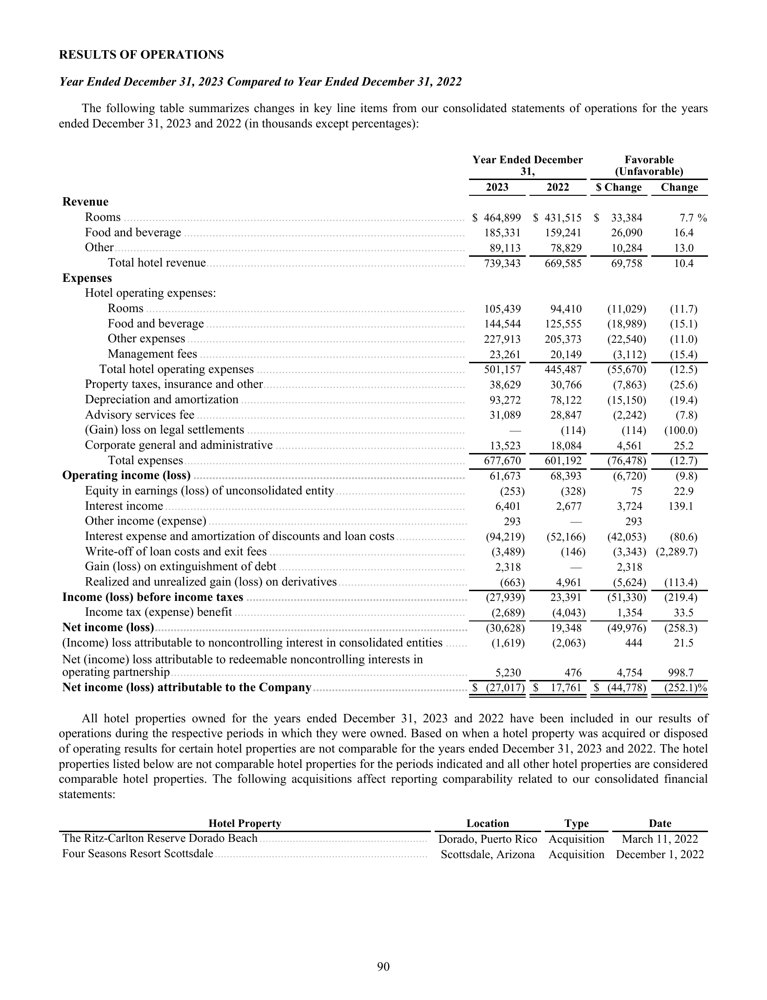

In [38]:
show_doc_and_md(
    "/kaggle/input/pdf-files-pages/2023-annual-report-96.pdf",
    "/kaggle/working/2023-annual-report-96.md",
    title="2023-annual-report-96 — OCR Extraction Preview"
)

## **Example n°2**

In [6]:
! docling --to html --to md --pipeline vlm --vlm-model granite_docling "/kaggle/input/pdf-files-pages/RHG_annual_report_2022_page-0047.pdf"

2025-09-18 14:45:59.602880: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758206759.628857     943 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758206759.636654     943 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



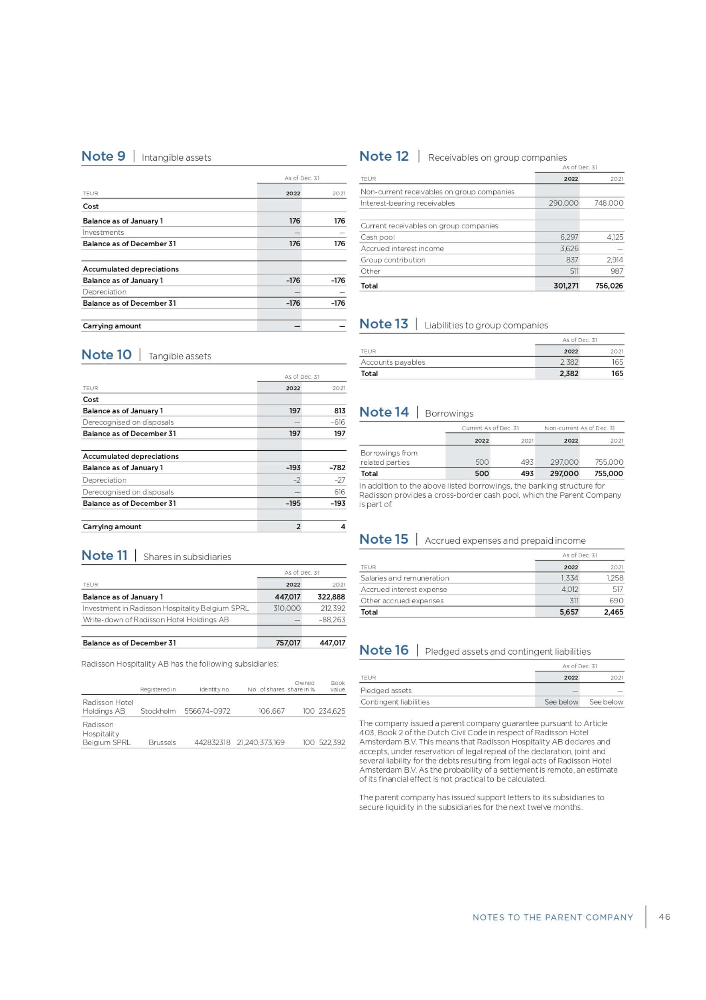

In [39]:
show_doc_and_md(
    "/kaggle/input/pdf-files-pages/RHG_annual_report_2022_page-0047.pdf",
    "/kaggle/working/RHG_annual_report_2022_page-0047.md",
    title="RHG_annual_report_2022_page-0047 — OCR Extraction Preview"
)

## **Example n°3**

In [8]:
! docling --to html --to md --pipeline vlm --vlm-model granite_docling "/kaggle/input/nvidia-annual-report/NVIDIA_Report_Removed_Pages-1-16-10.pdf"

2025-09-18 14:47:04.554367: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758206824.580857     987 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758206824.588620     987 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



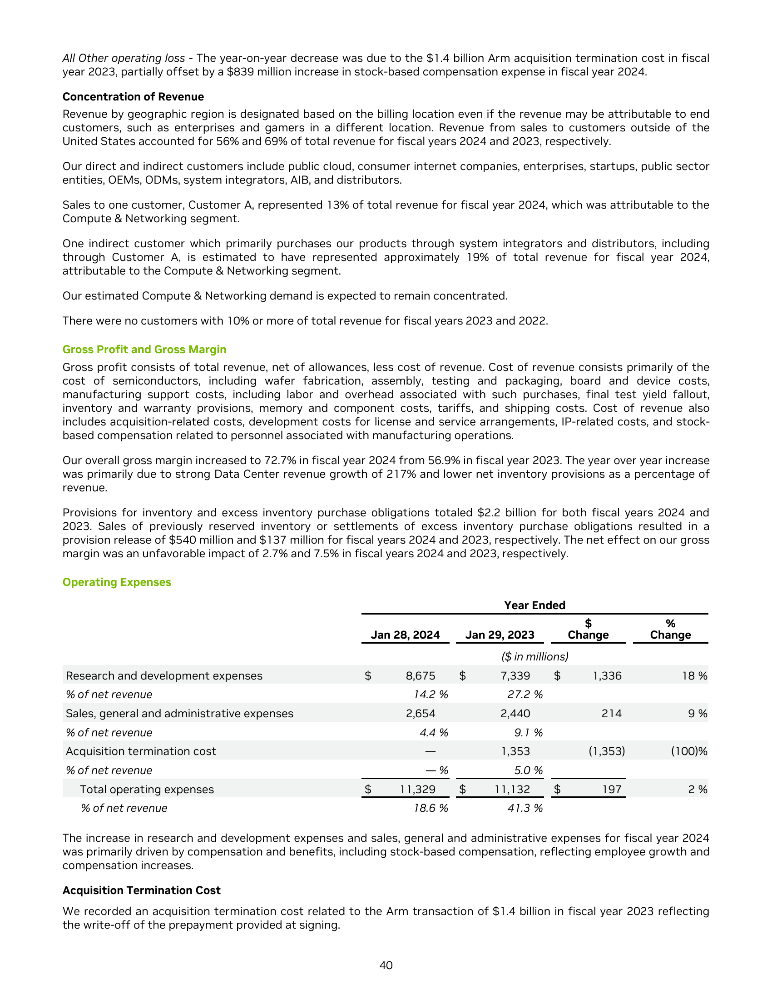

In [42]:
show_doc_and_md(
    "/kaggle/input/nvidia-annual-report/NVIDIA_Report_Removed_Pages-1-16-10.pdf",
    "/kaggle/working/NVIDIA_Report_Removed_Pages-1-16-10.md",
    title="NVIDIA_Report_Removed_Pages-1-16-10 — OCR Extraction Preview"
)

## **Example n°4**

In [10]:
! docling --to html --to md --pipeline vlm --vlm-model granite_docling "/kaggle/input/tables-different-cases-cropped/aramco_page_5.pdf"

2025-09-18 14:48:06.817493: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758206886.842613    1033 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758206886.850004    1033 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



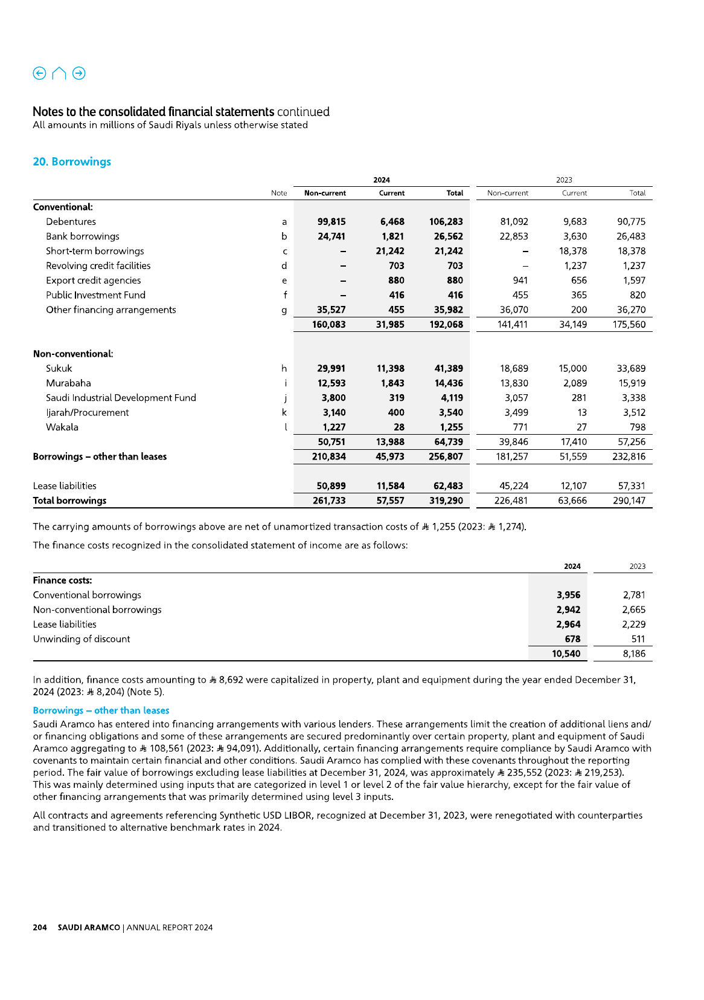

In [43]:
show_doc_and_md(
    "/kaggle/input/tables-different-cases-cropped/aramco_page_5.pdf",
    "/kaggle/working/aramco_page_5.md",
    title="aramco_page_5 — OCR Extraction Preview"
)

## **Example n°5**

In [12]:
! docling --to html --to md --pipeline vlm --vlm-model granite_docling "/kaggle/input/pdf-files-pages/CLAS-FY2023-AR_page-0066.pdf"

2025-09-18 14:49:09.130556: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758206949.155230    1077 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758206949.162906    1077 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



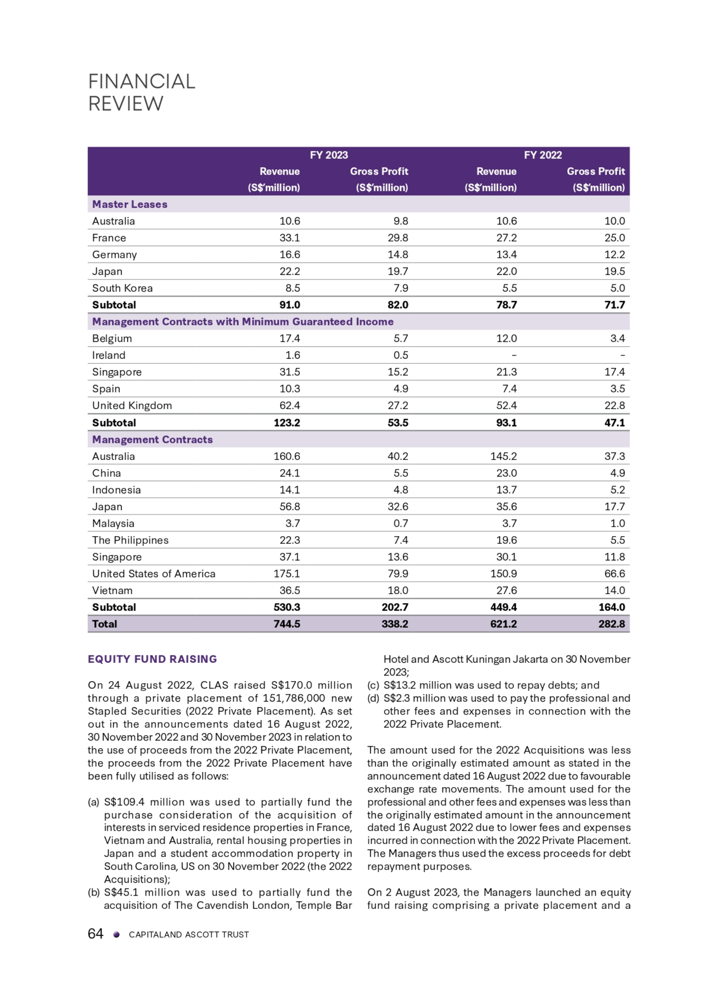

In [44]:
show_doc_and_md(
    "/kaggle/input/pdf-files-pages/CLAS-FY2023-AR_page-0066.pdf",
    "/kaggle/working/CLAS-FY2023-AR_page-0066.md",
    title="CLAS-FY2023-AR_page-0066 — OCR Extraction Preview"
)

## **Example n°6**

In [14]:
! docling --to html --to md --pipeline vlm --vlm-model granite_docling "/kaggle/input/pdf-files-pages/Marriott International Reports Third Quarter 2024 Results_page-0011.pdf"

2025-09-18 14:50:08.673538: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758207008.697511    1124 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758207008.704757    1124 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



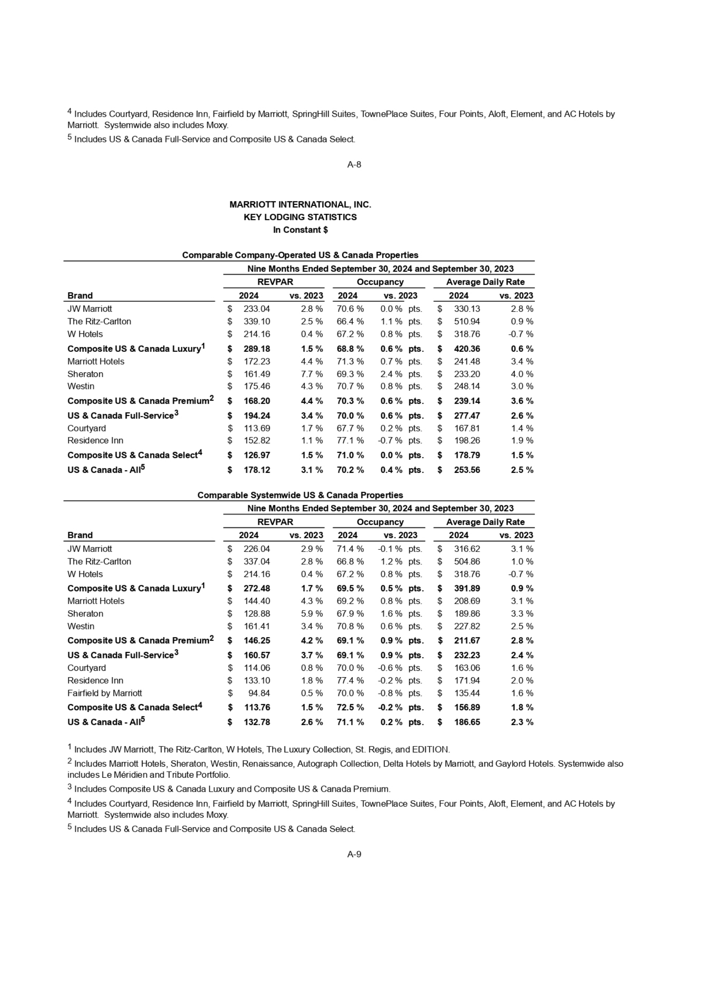

In [45]:
show_doc_and_md(
    "/kaggle/input/pdf-files-pages/Marriott International Reports Third Quarter 2024 Results_page-0011.pdf",
    "/kaggle/working/Marriott International Reports Third Quarter 2024 Results_page-0011.md",
    title="Marriott International Reports Third Quarter 2024 Results_page-0011 — OCR Extraction Preview"
)

## **Example n°7**

In [16]:
! docling --to html --to md --pipeline vlm --vlm-model granite_docling "/kaggle/input/pdf-files-pages/q4-2023-earnings-release_page-0007.pdf"

2025-09-18 14:51:25.177179: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758207085.202593    1169 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758207085.211178    1169 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



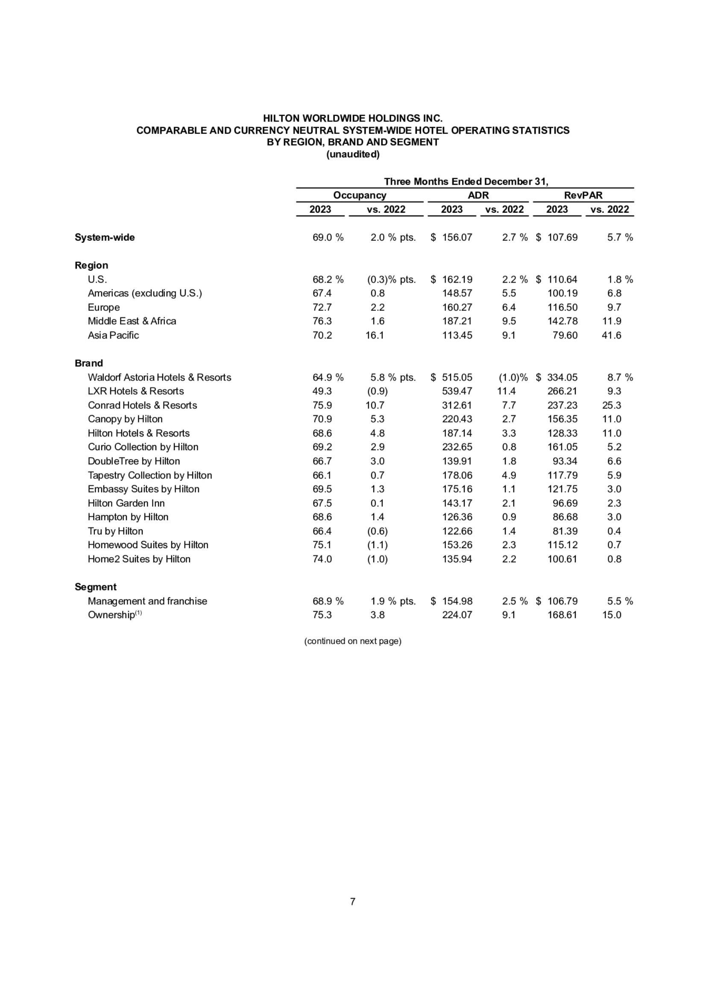

In [46]:
show_doc_and_md(
    "/kaggle/input/pdf-files-pages/q4-2023-earnings-release_page-0007.pdf",
    "/kaggle/working/q4-2023-earnings-release_page-0007.md",
    title="q4-2023-earnings-release_page-0007 — OCR Extraction Preview"
)

## **Example n°8**

In [18]:
! docling --to html --to md --pipeline vlm --vlm-model granite_docling "/kaggle/input/pdf-files-pages/CLAS-FY2023-AR_page-0069.pdf"

2025-09-18 14:52:17.067479: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758207137.092457    1212 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758207137.099977    1212 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



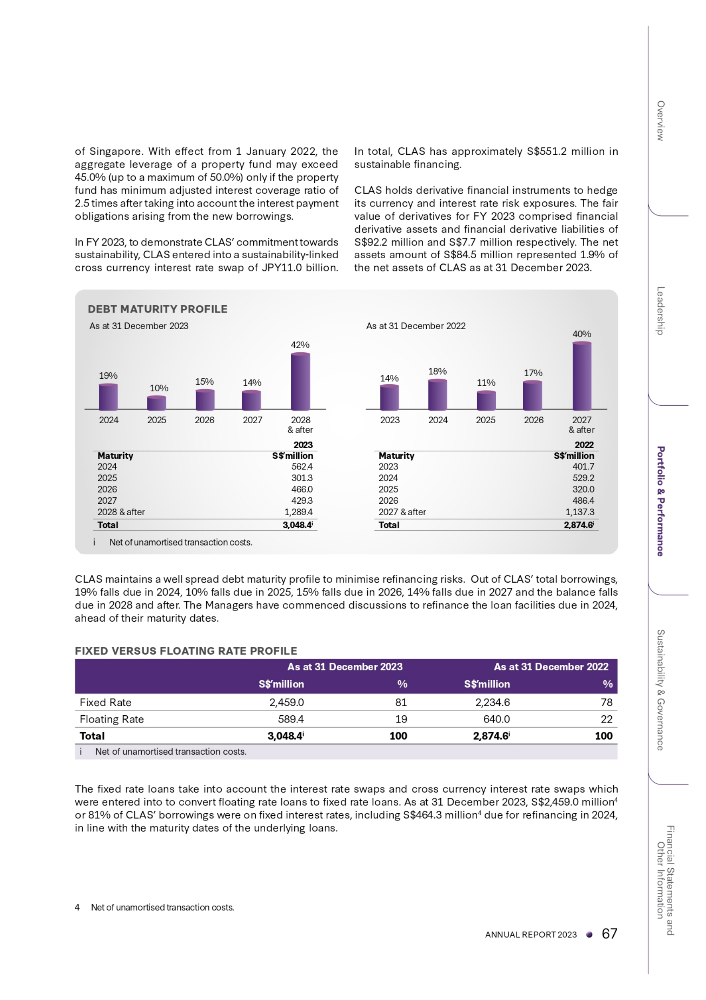
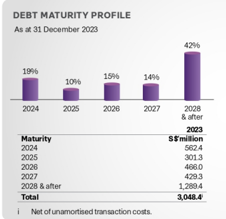
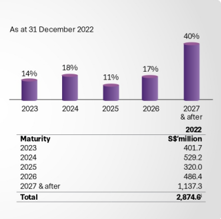

In [47]:
show_doc_and_md(
    "/kaggle/input/pdf-files-pages/CLAS-FY2023-AR_page-0069.pdf",
    "/kaggle/working/CLAS-FY2023-AR_page-0069.md",
    title="CLAS-FY2023-AR_page-0069 — OCR Extraction Preview"
)

## **Example n°9**

In [20]:
! docling --to html --to md --pipeline vlm --vlm-model granite_docling "/kaggle/input/pdf-files-pages/Blackstone4Q24EarningsPressRelease_page-0020.pdf"

2025-09-18 14:53:03.356931: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758207183.380167    1257 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758207183.387411    1257 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



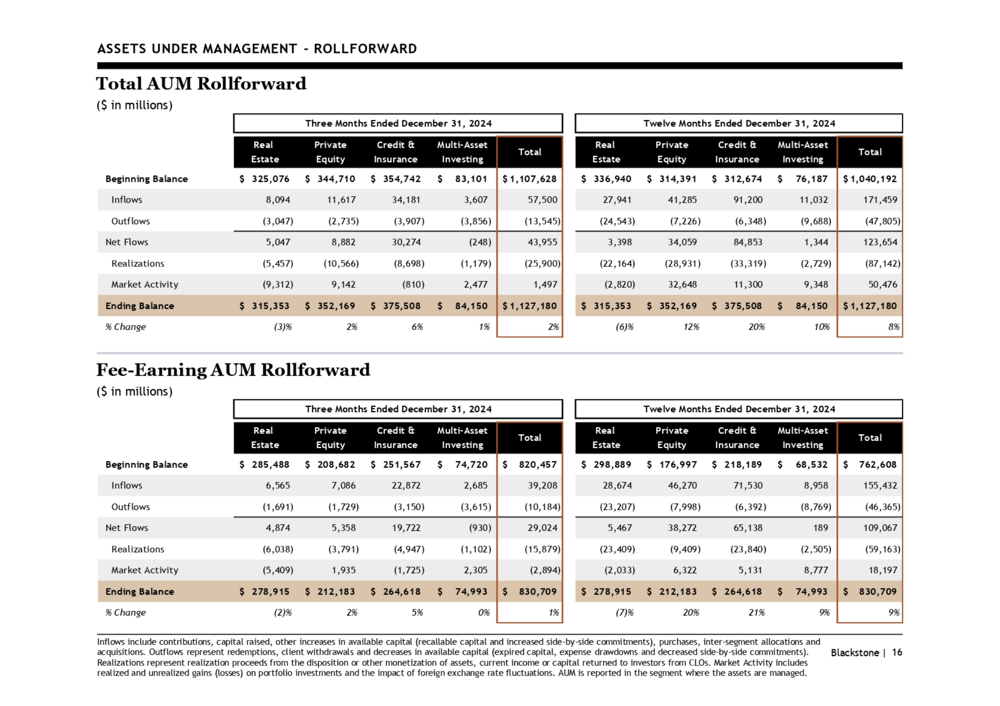

In [48]:
show_doc_and_md(
    "/kaggle/input/pdf-files-pages/Blackstone4Q24EarningsPressRelease_page-0020.pdf",
    "/kaggle/working/Blackstone4Q24EarningsPressRelease_page-0020.md",
    title="Blackstone4Q24EarningsPressRelease_page-0020 — OCR Extraction Preview"
)

## **Example n°10**

In [22]:
! docling --to html --to md --pipeline vlm --vlm-model granite_docling "/kaggle/input/pdf-files-pages/doc1.pdf"

2025-09-18 14:54:04.539066: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758207244.562386    1301 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758207244.569584    1301 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



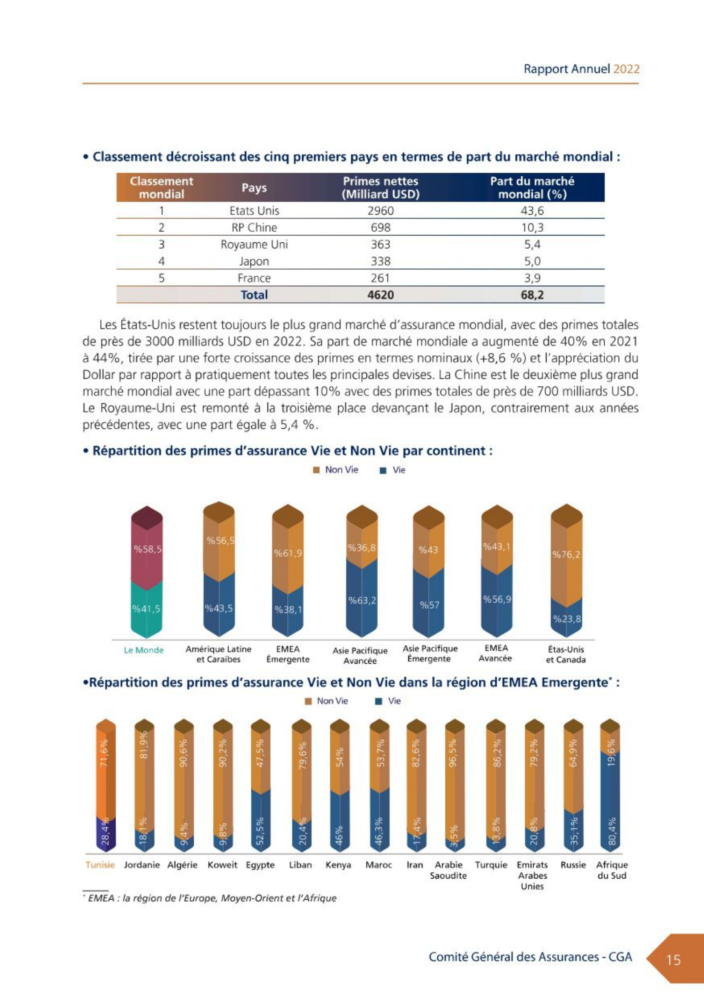
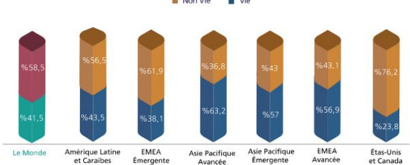
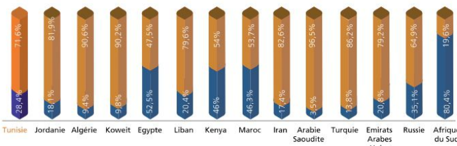

In [49]:
show_doc_and_md(
    "/kaggle/input/pdf-files-pages/doc1.pdf",
    "/kaggle/working/doc1.md",
    title="doc1 — OCR Extraction Preview"
)

## **Example n°11**

In [24]:
! docling --to html --to md --pipeline vlm --vlm-model granite_docling "/kaggle/input/nvidia-annual-report/NVIDIA_Report_Removed_Pages-1-16-9.pdf"

2025-09-18 14:54:41.866421: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758207281.890696    1344 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758207281.897982    1344 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [50]:
show_doc_and_md(
    "/kaggle/input/pdf-files-pages/NVIDIA_Report_Removed_Pages-1-16-9.pdf",
    "/kaggle/working/NVIDIA_Report_Removed_Pages-1-16-9.md",
    title="NVIDIA_Report_Removed_Pages-1-16-9 — OCR Extraction Preview"
)

## **Example n°12**

In [26]:
! docling --to html --to md --pipeline vlm --vlm-model granite_docling "/kaggle/input/high-quality-invoice-images-for-ocr/batch_1/batch_1/batch1_1/batch1-0001.jpg"

2025-09-18 14:55:28.460106: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758207328.483784    1386 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758207328.490473    1386 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



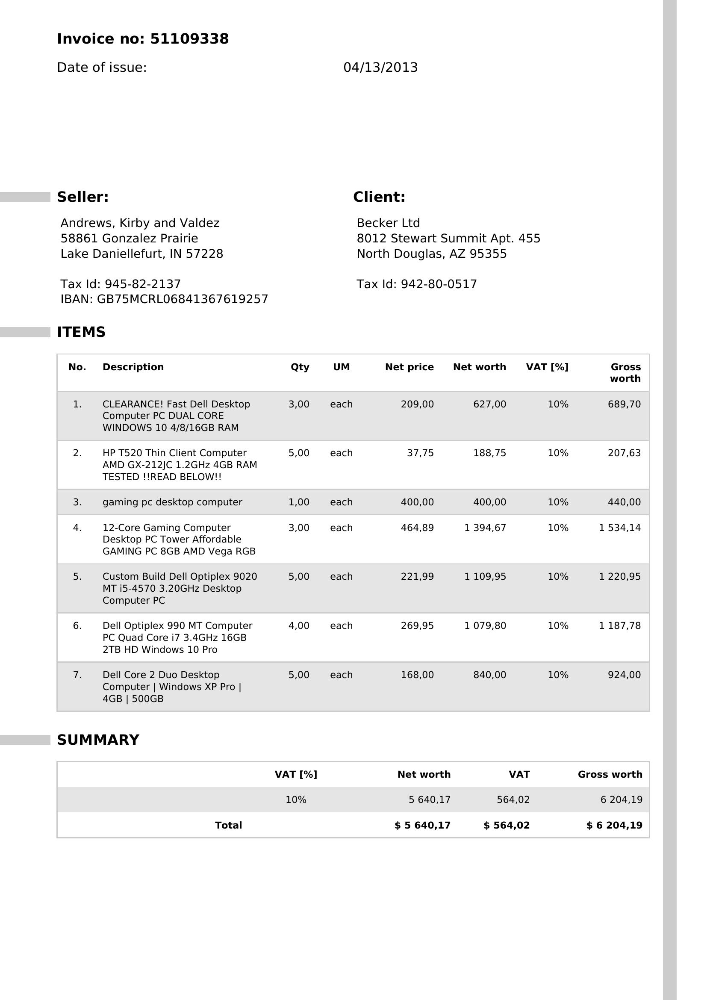

In [51]:
show_doc_and_md(
    "/kaggle/input/high-quality-invoice-images-for-ocr/batch_1/batch_1/batch1_1/batch1-0001.jpg",
    "/kaggle/working/batch1-0001.md",
    title="batch1-0001 — OCR Extraction Preview"
)

# Conclusion

Overall, the [**IBM Granite DocLing 258M**](https://huggingface.co/ibm-granite/granite-docling-258M) model performs well for **general document parsing and layout understanding**. It is effective at handling diverse page structures and provides useful results across different document types.

However, when we focus on **fine-grained details** such as small text, table structures, or precise formatting, it occasionally makes errors. These limitations suggest that while the model is reliable for broad extraction tasks, **additional validation or post-processing may be needed** in use cases that require high precision.